In [108]:
!git clone https://github.com/himanshuagarwal184/Self-Driving.git

fatal: destination path 'Self-Driving' already exists and is not an empty directory.


In [109]:
!ls Self-Driving

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import image as mpimg
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Flatten
import keras
from sklearn.model_selection import train_test_split as tts
from sklearn.utils import shuffle
from keras.optimizers import Adam
from keras.layers.convolutional import Convolution2D
import cv2
import ntpath
import pandas as pd
import random
from imgaug import augmenters as iaa

In [2]:
datadir = r"C:\Users\Himanshu\Desktop\prokect\Self Driving\data_latest2\track"
columns = ['center','left','right','steering','throttle','reverse','speed']
df = pd.read_csv(os.path.join(datadir,'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth',None)

In [4]:
df.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [4]:
def path_leaf(path):
  path = path.split('\\')
  path = path[-1]
  return path

In [5]:
df['center']=df['center'].apply(path_leaf)
df['left']=df['left'].apply(path_leaf)
df['right']=df['right'].apply(path_leaf)

In [6]:
df.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [7]:
num_bins = 25
sample_per_bin = 400
hist,bins = np.histogram(df['steering'],num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
print(bins)


[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


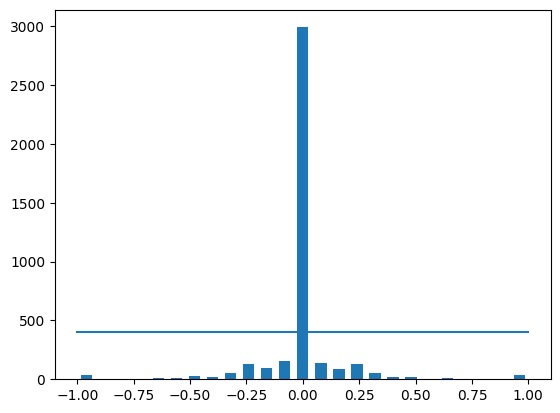

In [8]:
plt.bar(center,hist,width=0.05)
plt.plot((np.min(df['steering']),np.max(df['steering'])),(sample_per_bin,sample_per_bin))

Total Data  4053
Removed :  2590
Remaining :  1463


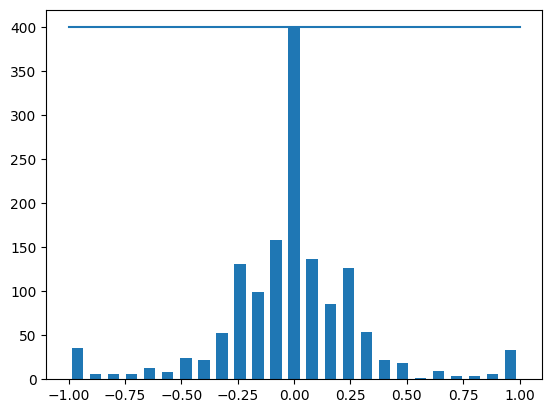

In [9]:
print('Total Data ',len(df))
remove_list = []
for j in range(num_bins):
  lists = []
  for i in range(len(df['steering'])):
    if df['steering'][i] >= bins[j] and df['steering'][i] <= bins[j+1]:
      lists.append(i)
  lists = shuffle(lists)
  lists = lists[sample_per_bin:]
  remove_list.extend(lists)

print("Removed : ",len(remove_list))
df.drop(df.index[remove_list],inplace=True)
print("Remaining : ",len(df))

hist, _ = np.histogram(df['steering'], (num_bins))
plt.bar(center,hist,width=0.05)
plt.plot((np.min(df['steering']),np.max(df['steering'])),(sample_per_bin,sample_per_bin))

In [10]:
def load_img_steering(datadir,df):
  image_path = []
  steering = []
  for i in range(len(df)):
    index_data = df.iloc[i]
    center, left, right = index_data[0],index_data[1],index_data[2]
    image_path.append(os.path.join(datadir,center.strip()))
    steering.append(float(index_data[3]))

    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(index_data[3]) + 0.15)
    
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(index_data[3]) - 0.15)
  image_path = np.asarray(image_path)
  steering = np.asarray(steering)
  return image_path,steering

image_path , steering = load_img_steering(datadir+'/IMG',df)

C:\Users\Himanshu\AppData\Local\Temp\ipykernel_14924\3703550169.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = index_data[0],index_data[1],index_data[2]
C:\Users\Himanshu\AppData\Local\Temp\ipykernel_14924\3703550169.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(index_data[3]))
C:\Users\Himanshu\AppData\Local\Temp\ipykernel_14924\3703550169.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `se

In [11]:
len(image_path)

4389

In [12]:
x_train, x_test, y_train, y_test = tts(image_path,steering,train_size=0.8,random_state=42)

In [13]:
len(x_train), len(x_test), len(y_train), len(y_test)

(3511, 878, 3511, 878)

Text(0.5, 1.0, 'Validation Set')

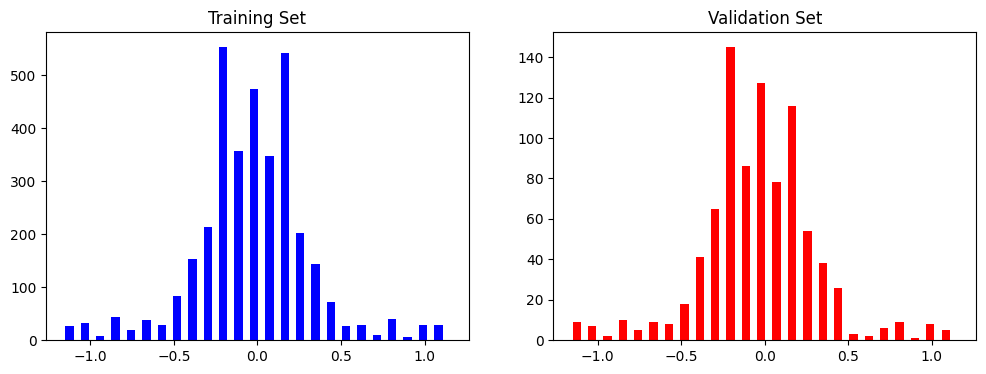

In [14]:
fig, axes=  plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_train,bins=num_bins,width=.05,color='blue')
axes[0].set_title('Training Set')

axes[1].hist(y_test,bins=num_bins,width=.05,color='red')
axes[1].set_title('Validation Set')

In [15]:
def zoom(img):
    zoom = iaa.Affine(scale=(1,1.3))
    img = zoom.augment_image(img)
    return img

C:\Users\Himanshu\Desktop\prokect\Self Driving\data_latest2\track/IMG\right_2018_07_16_17_12_15_069.jpg


Text(0.5, 1.0, 'zoomed Image')

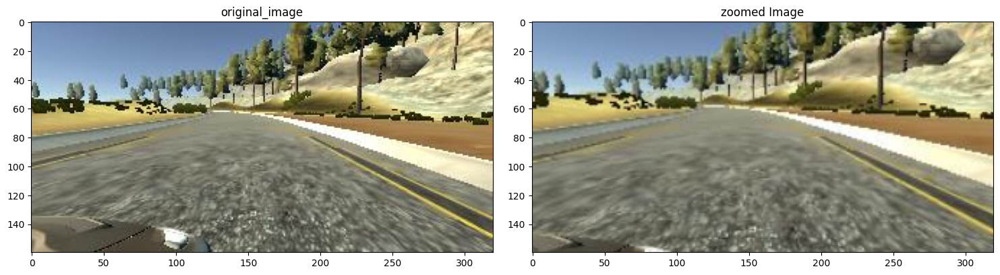

In [16]:
image = image_path[random.randint(0,1000)]
print(image)
og_img = mpimg.imread(image)
zoomed_image = zoom(og_img)
fig,axes = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(og_img)
axes[0].set_title("original_image")
axes[1].imshow(zoomed_image)
axes[1].set_title("zoomed Image")


In [17]:
def pan(img):
    pan = iaa.Affine(translate_percent={"x":(-.1,.1), "y":(-.1,.1)})
    pan_img = pan.augment_image(img)
    return pan_img

Text(0.5, 1.0, 'Percent Translation Image')

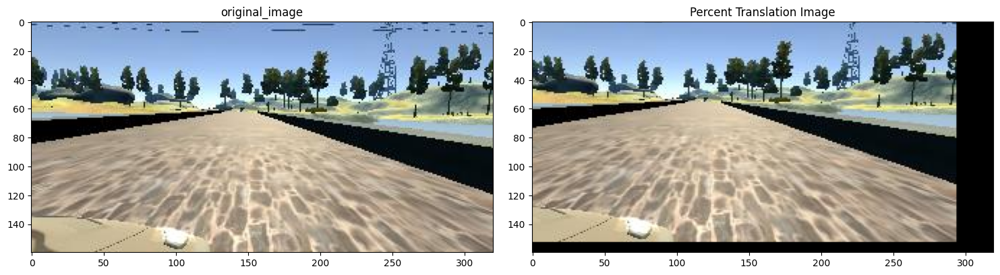

In [18]:
image = image_path[random.randint(0,1000)]
og_img = mpimg.imread(image)
zoomed_image = pan(og_img)
fig,axes = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(og_img)
axes[0].set_title("original_image")
axes[1].imshow(zoomed_image)
axes[1].set_title("Percent Translation Image")

In [19]:
def alter_brightness(img):
    brightImg = iaa.Multiply((0.2,1.2))
    img  = brightImg.augment_image(img)
    return img

Text(0.5, 1.0, 'Bright Image')

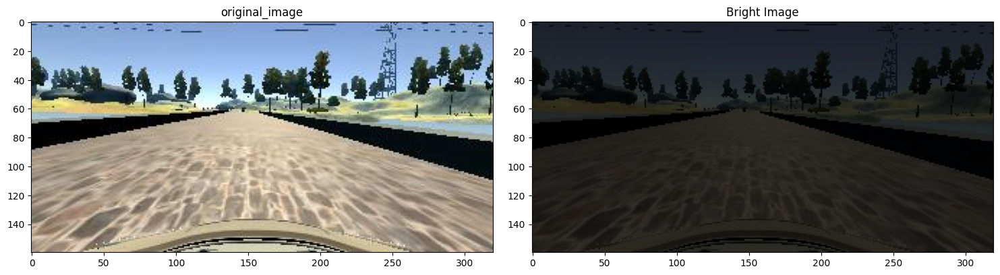

In [20]:
image = image_path[random.randint(0,1000)]
og_img = mpimg.imread(image)
bright_image = alter_brightness(og_img)
fig,axes = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(og_img)
axes[0].set_title("original_image")
axes[1].imshow(bright_image)
axes[1].set_title("Bright Image")

In [21]:
def flip(img,steering_angle):
    flip = cv2.flip(img,1)
    steering_angle = -steering_angle
    return flip,steering_angle

Text(0.5, 1.0, 'Flipped ImageSteering Angle : -0.0')

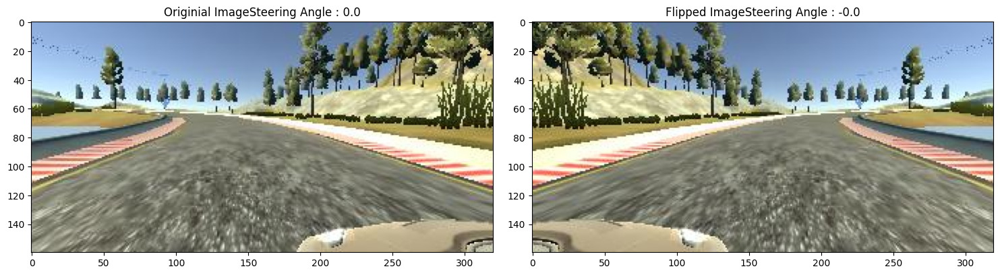

In [22]:
idx = random.randint(0,1000)
img = image_path[idx]
steering_angle = steering[idx]
og_img = mpimg.imread(img)
flip_image,flip_steering_angle = flip(og_img,steering_angle)
fig,axes = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(og_img)
axes[0].set_title("Originial Image" + 'Steering Angle : ' + str(steering_angle))

axes[1].imshow(flip_image)
axes[1].set_title("Flipped Image" + 'Steering Angle : ' + str(flip_steering_angle))

In [23]:
def random_augment(image,steering):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = alter_brightness(image)
    if np.random.rand() < 0.5:
        image , steering = flip(image,steering)
    return image , steering

        

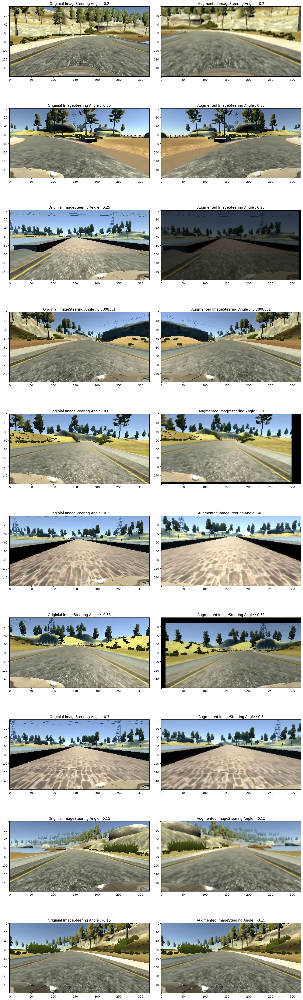

In [24]:
ncol = 2
nrow = 10
fig , axes = plt.subplots(nrow,ncol,figsize=(15,50))
fig.tight_layout()

for i in range(10):
    num = random.randint(0,len(image_path) - 1)
    random_image = image_path[num]
    random_steering = steering[num]
    
    og_img = mpimg.imread(random_image)
    aug_img , aug_steer_angle= random_augment(random_image,random_steering) 
    
    axes[i][0].imshow(og_img)
    axes[i][0].set_title("Originial Image" + 'Steering Angle : ' + str(random_steering))

    axes[i][1].imshow(aug_img)
    axes[i][1].set_title("Augmented Image" + 'Steering Angle : ' + str(aug_steer_angle))
    

In [25]:
def img_preprocess(img):
  # img = npimg.imread(img)
  img = img[60:135,:,:]
  img = cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,(3,3),0)
  img = cv2.resize(img, (200,66))
  img = img/255
  return img

In [26]:
def batch_generator(img_path, steering_angle, batch_size,isTraining):
    """
    Return:
        Returns a single value or a collection of values.
        The function execution is terminated when return is encountered.
        The function's local state is lost after return.
    Yield:
        Returns a value, but the function's execution is paused, not terminated.
        The function's local state is preserved, allowing it to resume where it left off.
        Multiple values can be yielded, making it a generator.
    Here we will use Yield
    """
    
    while True:
        batch_img = []
        batch_steering = []
        
        for i in range(batch_size):
            random_index = random.randint(0,len(img_path)-1)
            if isTraining:
                im, steering = random_augment(img_path[random_index], steering_angle[random_index])
            else:
                im = mpimg.imread(img_path[random_index])
                steering = steering_angle[random_index]
            
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Preprocessed Image')

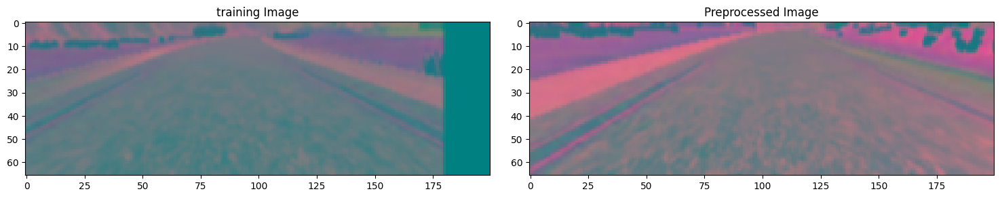

In [78]:
x_train_gen ,y_train_gen = next(batch_generator(x_train,y_train,1,1))
x_test_gen ,y_test_gen = next(batch_generator(x_test,y_test,1,0))


fig,axes = plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()


axes[0].imshow(x_train_gen[0])
axes[0].set_title("training Image")

axes[1].imshow(x_test_gen[0])
axes[1].set_title("Preprocessed Image")

In [5]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24,(5,5),strides=(2,2),activation='elu',input_shape=(66,200,3)))
  model.add(Conv2D(36,(5,5),strides=(2,2),activation='elu'))
  model.add(Conv2D(48,(5,5),strides=(2,2),activation='elu'))
  model.add(Conv2D(64,(3,3),activation='elu'))
  # model.add(Conv2D(64,(3,3),activation='elu'))
  model.add(Flatten())
  model.add(Dense(100,activation='elu'))
  model.add(Dense(50,activation='elu'))
  model.add(Dense(10,activation='elu'))
  model.add(Dense(1))
  optimizer=Adam(learning_rate=1e-3)
  model.compile(loss='mse',optimizer=optimizer)
  return model


In [6]:
model = nvidia_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 flatten (Flatten)           (None, 3840)              0         
                                                                 
 dense (Dense)               (None, 100)               384100    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [29]:
history = model.fit_generator(batch_generator(x_train,y_train,batch_size=100,isTraining = 1),
                              steps_per_epoch=300,
                              epochs=25,
                              validation_data=batch_generator(x_test,y_test,batch_size=100,isTraining = 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle=1)

C:\Users\Himanshu\AppData\Local\Temp\ipykernel_14924\2475183328.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(x_train,y_train,batch_size=100,isTraining = 1),


Epoch 1/25
300/300 [==============================] - 145s 461ms/step - loss: 0.3618 - accuracy: 0.1019 - val_loss: 0.0849 - val_accuracy: 0.1154
Epoch 2/25
300/300 [==============================] - 139s 464ms/step - loss: 0.0833 - accuracy: 0.1059 - val_loss: 0.0599 - val_accuracy: 0.1154
Epoch 3/25
300/300 [==============================] - 141s 473ms/step - loss: 0.0728 - accuracy: 0.1017 - val_loss: 0.0486 - val_accuracy: 0.1204
Epoch 4/25
300/300 [==============================] - 139s 463ms/step - loss: 0.0638 - accuracy: 0.1046 - val_loss: 0.0443 - val_accuracy: 0.1182
Epoch 5/25
300/300 [==============================] - 142s 475ms/step - loss: 0.0579 - accuracy: 0.1067 - val_loss: 0.0527 - val_accuracy: 0.1209
Epoch 6/25
300/300 [==============================] - 160s 534ms/step - loss: 0.0527 - accuracy: 0.1077 - val_loss: 0.0367 - val_accuracy: 0.1216
Epoch 7/25
300/300 [==============================] - 270s 901ms/step - loss: 0.0498 - accuracy: 0.1074 - val_loss: 0.0390 -

KeyboardInterrupt: 

In [44]:
histo = model.fit_generator(batch_generator(x_train,y_train,batch_size=100,isTraining = 1),
                              steps_per_epoch=300,
                              epochs=15,
                              validation_data=batch_generator(x_test,y_test,batch_size=100,isTraining = 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle=1)

C:\Users\Himanshu\AppData\Local\Temp\ipykernel_13324\3745595594.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  histo = model.fit_generator(batch_generator(x_train,y_train,batch_size=100,isTraining = 1),


Epoch 1/15
300/300 [==============================] - 146s 488ms/step - loss: 0.0496 - val_loss: 0.0435
Epoch 2/15
300/300 [==============================] - 148s 495ms/step - loss: 0.0478 - val_loss: 0.0432
Epoch 3/15
300/300 [==============================] - 212s 707ms/step - loss: 0.0448 - val_loss: 0.0372
Epoch 4/15
300/300 [==============================] - 600s 2s/step - loss: 0.0431 - val_loss: 0.0321
Epoch 5/15
300/300 [==============================] - 141s 470ms/step - loss: 0.0428 - val_loss: 0.0297
Epoch 6/15
300/300 [==============================] - 146s 489ms/step - loss: 0.0399 - val_loss: 0.0306
Epoch 7/15
300/300 [==============================] - 146s 488ms/step - loss: 0.0376 - val_loss: 0.0301
Epoch 8/15
300/300 [==============================] - 142s 474ms/step - loss: 0.0369 - val_loss: 0.0294
Epoch 9/15
300/300 [==============================] - 142s 474ms/step - loss: 0.0347 - val_loss: 0.0278
Epoch 10/15
300/300 [==============================] - 150s 502ms/s

In [88]:
len(x_train)

1272

In [30]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training ','Validation'])
plt.title('Loss')
plt.xlabel('Epochs')


NameError: name 'history' is not defined

In [48]:
plt.plot(histo.history['loss'])
plt.plot(histo.history['val_loss'])
plt.legend(['Training ','Validation'])
plt.title('Loss')
plt.xlabel('Epochs')


NameError: name 'histo' is not defined

In [84]:
model.save("modelFinal3.h5")